In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


import warnings
warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:.5f}'.format

In [ ]:
# Google Drive Mount

from google.colab import auth
auth.authenticate_user()

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%cd /content/gdrive/Shareddrives/cj공모전/최종코드/시계열

/content/gdrive/Shareddrives/cj공모전/최종코드/시계열


In [ ]:
%ls

 cluster_label.pkl             spark-3.0.3-bin-hadoop2.7.tgz
 fc주문_통합_수정.pkl          spark-3.0.3-bin-hadoop2.7.tgz.1
 시계열클러스터링_최종.ipynb   spark-3.0.3-bin-hadoop2.7.tgz.2
'시계열클러스터링 pre.ipynb'   시계열week.pkl
 spark-3.0.3-bin-hadoop2.7/


### Spark Dataframe

In [ ]:
!apt-get install openjdk-8-jdk-headless

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openjdk-8-jdk-headless is already the newest version (8u292-b10-0ubuntu1~18.04).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [ ]:
!wget -q https://downloads.apache.org/spark/spark-3.0.3/spark-3.0.3-bin-hadoop2.7.tgz

In [ ]:
!tar -xvf spark-3.0.3-bin-hadoop2.7.tgz 

spark-3.0.3-bin-hadoop2.7/
spark-3.0.3-bin-hadoop2.7/NOTICE
spark-3.0.3-bin-hadoop2.7/kubernetes/
spark-3.0.3-bin-hadoop2.7/kubernetes/tests/
spark-3.0.3-bin-hadoop2.7/kubernetes/tests/worker_memory_check.py
spark-3.0.3-bin-hadoop2.7/kubernetes/tests/py_container_checks.py
spark-3.0.3-bin-hadoop2.7/kubernetes/tests/pyfiles.py
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/entrypoint.sh
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/bindings/
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/bindings/R/
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/bindings/R/Dockerfile
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/bindings/python/
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/bindings/python/Dockerfile
spark-3.0.3-bin-hadoop2.7/kubernetes/dockerfiles/spark/Dockerfile
spark-3.0.3-bin-hadoop2.7/jars/
spark-3.0.3-bin-hadoop2.7/jars/jacks

In [ ]:
!pip install -q findspark

In [ ]:
#자바, 스파크 경로 설정
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/gdrive/Shareddrives/cj공모전/최종코드/시계열/spark-3.0.3-bin-hadoop2.7"

In [ ]:
import findspark
findspark.init()
import pyspark

from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("spark3_test").master("local[*]").getOrCreate()

## Clustering

In [ ]:
pip install tslearn

In [ ]:
pip install folium

In [ ]:
# import spark
spark.conf.set("spark.sql.execution.arrow.enabled", "true") # For making conversion of pandas effective

import datetime
import collections
import folium

from pyspark.sql.functions import *
from pyspark.sql.types import *

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

from tslearn.clustering import TimeSeriesKMeans

In [ ]:
#시계열클러스터링pre에서 만든 아이템코드, 주 매트릭스
clus = pd.read_pickle("시계열week.pkl")
clus

week,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
ITEM_CD,,,,,,,,,,,,,,,,,,
0001,0,0,0,0,0,0,0,0,0,0,0,0,47,135,82,100,79,35
1,0,0,0,0,0,0,0,153,352,419,191,83,29,0,0,0,0,0
1001240388,0,4,1,2,0,4,2,1,0,0,2,0,0,0,0,0,0,0
1001284113,0,0,0,3,0,0,0,2,0,2,0,0,1,0,0,0,0,0
1001284472,4,3,5,8,5,7,7,4,3,4,4,3,1,8,2,8,7,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
shop0001676,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,13
shop0001678,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,2
shop0001679,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,3


In [ ]:
clus1 = clus.drop(['ITEM_CD'], axis=1)

In [ ]:
clus_ = clus['ITEM_CD']

In [ ]:
#품목별 수량을 주별로 리스트화
clus1['list'] = clus1.apply(lambda x: x.tolist(), axis = 1)
clus2 = clus1['list']
clus2

0       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 135, ...
1       [0, 0, 0, 0, 0, 0, 0, 153, 352, 419, 191, 83, ...
2       [0, 4, 1, 2, 0, 4, 2, 1, 0, 0, 2, 0, 0, 0, 0, ...
3       [0, 0, 0, 3, 0, 0, 0, 2, 0, 2, 0, 0, 1, 0, 0, ...
4       [4, 3, 5, 8, 5, 7, 7, 4, 3, 4, 4, 3, 1, 8, 2, ...
                              ...                        
5604    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
5605    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
5606    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
5607    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 199, 1...
5608    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 300, 2...
Name: list, Length: 5609, dtype: object

In [ ]:
result = pd.concat([clus_, clus2], axis=1)
result

,ITEM_CD,list
0,0001,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 135, ..."
1,1,"[0, 0, 0, 0, 0, 0, 0, 153, 352, 419, 191, 83, ..."
2,1001240388,"[0, 4, 1, 2, 0, 4, 2, 1, 0, 0, 2, 0, 0, 0, 0, ..."
3,1001284113,"[0, 0, 0, 3, 0, 0, 0, 2, 0, 2, 0, 0, 1, 0, 0, ..."
4,1001284472,"[4, 3, 5, 8, 5, 7, 7, 4, 3, 4, 4, 3, 1, 8, 2, ..."
...,...,...
5604,shop0001676,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5605,shop0001678,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5606,shop0001679,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5607,whole800001,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 199, 1..."


In [ ]:
df = spark.createDataFrame(result).cache() #pandas dataframe을 spark dataframe으로 변환

In [ ]:
df.show()

+----------+--------------------+
|   ITEM_CD|                list|
+----------+--------------------+
|      0001|[0, 0, 0, 0, 0, 0...|
|         1|[0, 0, 0, 0, 0, 0...|
|1001240388|[0, 4, 1, 2, 0, 4...|
|1001284113|[0, 0, 0, 3, 0, 0...|
|1001284472|[4, 3, 5, 8, 5, 7...|
|1001429503|[0, 0, 0, 0, 1, 1...|
|1001976994|[0, 0, 0, 6, 0, 0...|
| 112903777|[0, 0, 0, 0, 0, 2...|
| 112903795|[0, 0, 0, 0, 0, 0...|
| 120802614|[0, 3, 1, 4, 1, 0...|
| 120940161|[8, 26, 4, 12, 15...|
| 120941953|[16, 21, 28, 42, ...|
| 121015111|[4, 4, 3, 12, 2, ...|
| 121015149|[1, 0, 0, 0, 0, 1...|
| 121016303|[0, 0, 1, 0, 0, 3...|
| 121016312|[15, 8, 15, 11, 7...|
| 121016322|[4, 3, 1, 0, 2, 6...|
| 121016347|[20, 25, 16, 47, ...|
| 121016535|[0, 0, 2, 1, 1, 1...|
| 121111509|[10, 11, 6, 39, 1...|
+----------+--------------------+
only showing top 20 rows



In [ ]:
df_npy = np.array(df.collect()) # spark dataframe을 numpy로 변환
name_npy = np.array([np.array(x) for x in df_npy[:,0]])   #ITEM_CD 저장하는 데이터 변수
feature_npy = np.array([np.array(x) for x in df_npy[:,1]]) #ITEM_QTY의 시계열 데이터를 저장하는 데이터 변수

def normalization_axis(feature): #시계열 데이터의 효율적인 클러스터링을 위해 normalization을 진행
  sum_npy = np.array([x/np.sum(x) for x in feature])
  return sum_npy

feature_norm_npy = normalization_axis(feature_npy)
feature_npy = np.array([np.array(x) for x in df_npy[:,1]])

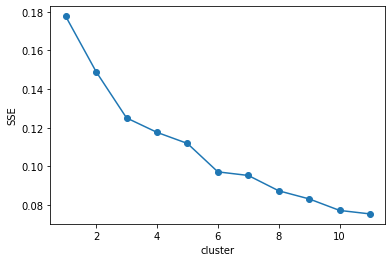

In [ ]:
# 튜닝작업 코드+최적 클러스터 개수
def para(X):
  sse=[]
  for i in range(1,12):
    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=150)
    km.fit(X)
    sse.append(km.inertia_)

  plt.plot(range(1,12), sse, marker='o')
  plt.xlabel('cluster')
  plt.ylabel('SSE')
  plt.show()

para(feature_norm_npy)



## 클러스터 개수 10개

In [ ]:
#클러스터 개수에 따른 SSE plot을 통해 최적 클러스터가 10임을 확인
n_cluster = 10
km = TimeSeriesKMeans(n_clusters=n_cluster, metric="euclidean", max_iter=150).fit(feature_norm_npy) # normalization 시계열 데이터를 활용해 euclidean 기반 클러스터링을 진행
rlt_tsm = km.predict(feature_norm_npy)

In [ ]:
# 클러스터별 분포도를 시각화하기 위해 전처리 작업
labels = []
sizes = []
for i in range(n_cluster):
  labels.append("cluster_"+str(i))
  sizes.append(collections.Counter(rlt_tsm)[i])

In [ ]:
total = str(feature_norm_npy.any(axis=1).shape[0])

Text(0.5, 1.2, 'Cluster Distribution (number of route:5609)')

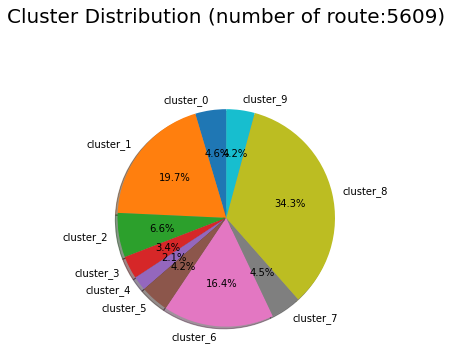

In [ ]:
plt.figure(figsize=(10,5))
plt.pie(sizes,labels=labels,shadow=True,startangle=90,autopct='%1.1f%%')
plt.title("Cluster Distribution (number of route:"+total+")",position=(0.5,1.2),fontsize=20)

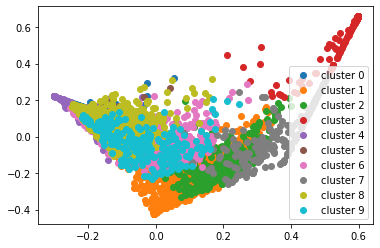

In [ ]:
pca = PCA(n_components=10)  # pca를 진행해 클러스터가 얼마나 잘됐는지 검토
rlt_pca = pca.fit_transform(feature_norm_npy[~np.isnan(feature_norm_npy).any(axis=1)])
for i in range(n_cluster):
  label_name = "cluster " +str(i)
  plt.scatter(rlt_pca[[rlt_tsm==i]][:,0],rlt_pca[[rlt_tsm==i]][:,1],label=label_name)
plt.legend()

In [ ]:
#클러스터 시각화
def show_cluster_dist(num_cluster,num_sample=20):
  plt.figure(figsize=(120,60))
  size = sizes[num_cluster]
  if(size>num_sample):
    size = num_sample
  for i in range(size):
    name = "cluster" + str(i) 
    plt.plot(['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18'],feature_norm_npy[[rlt_tsm==num_cluster]][i])
 
  plt.xlabel("date")
  plt.ylabel("ratio of usage")
  plt.title("Changes in usage rate of some cluster "+str(num_cluster),fontsize=30)
  plt.legend(name_npy,fontsize=50)
  plt.show()

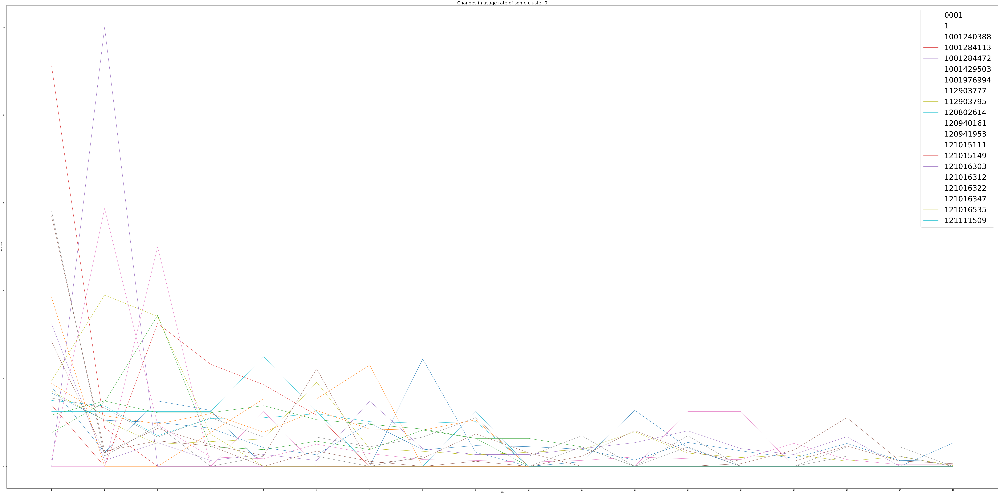

In [ ]:
show_cluster_dist(0)

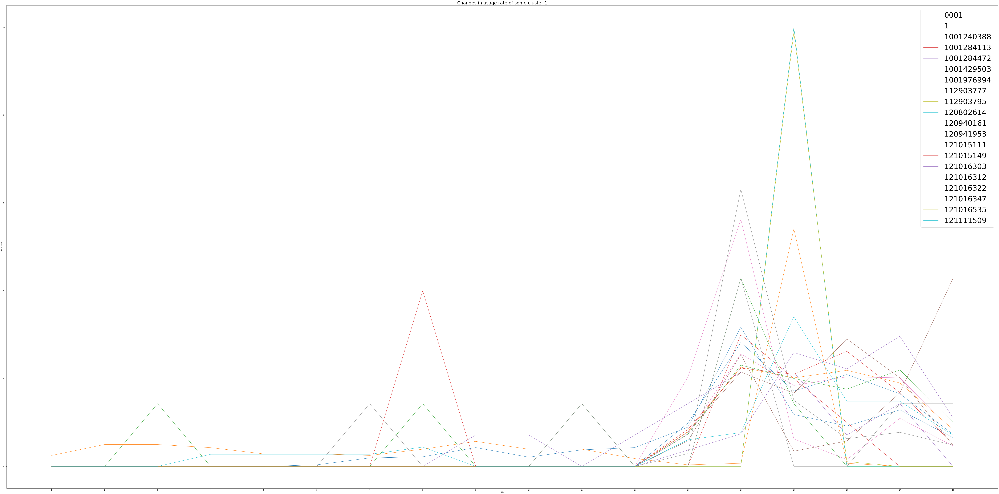

In [ ]:
show_cluster_dist(1)

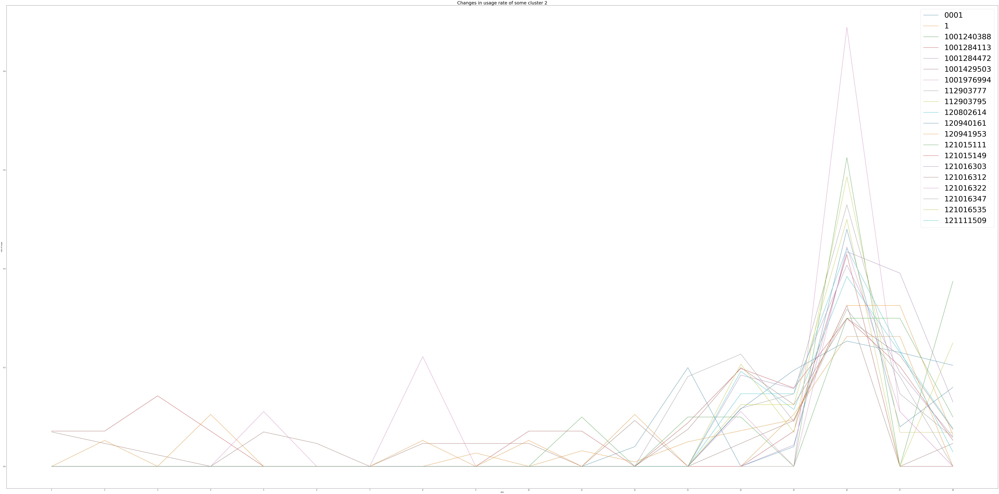

In [ ]:
show_cluster_dist(2)

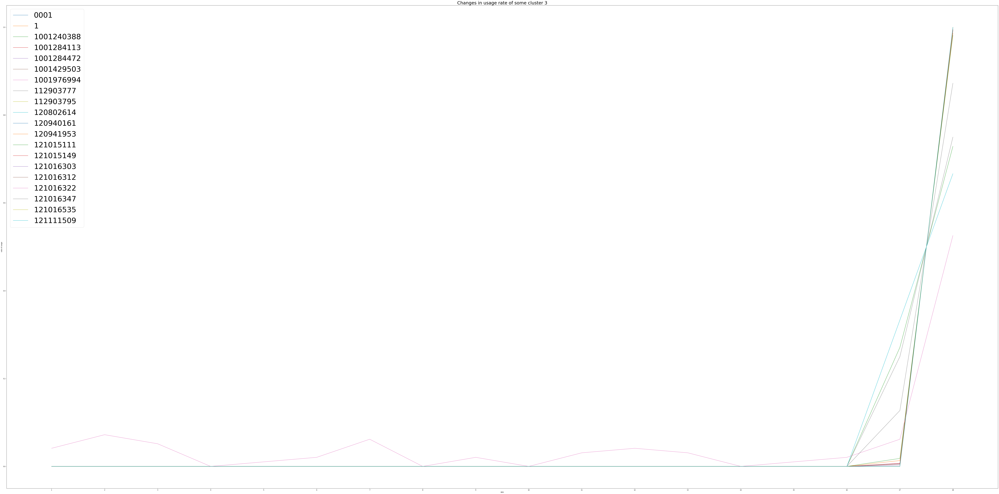

In [ ]:
show_cluster_dist(3)

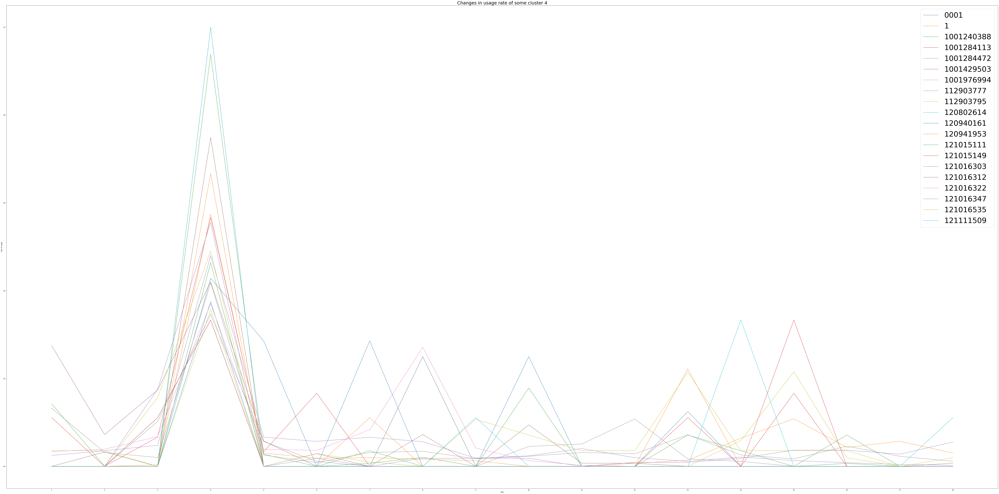

In [ ]:
show_cluster_dist(4)

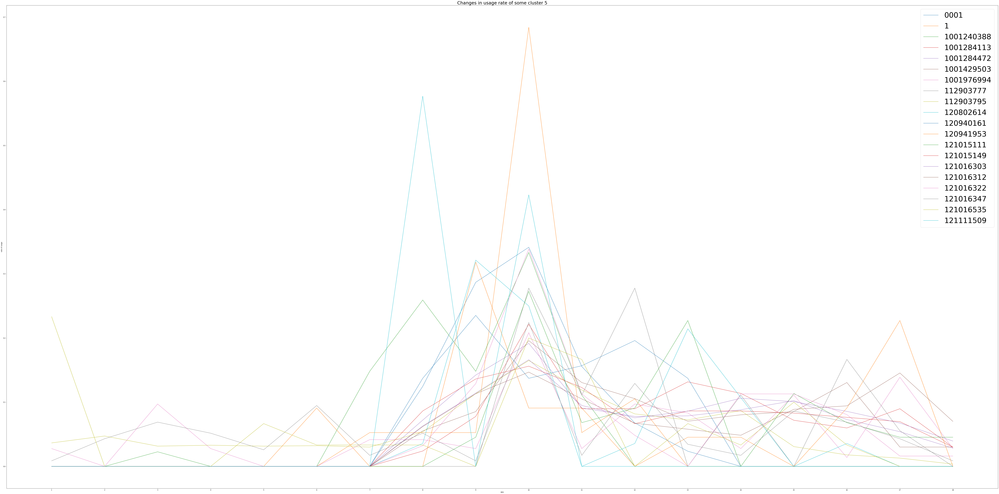

In [ ]:
show_cluster_dist(5)

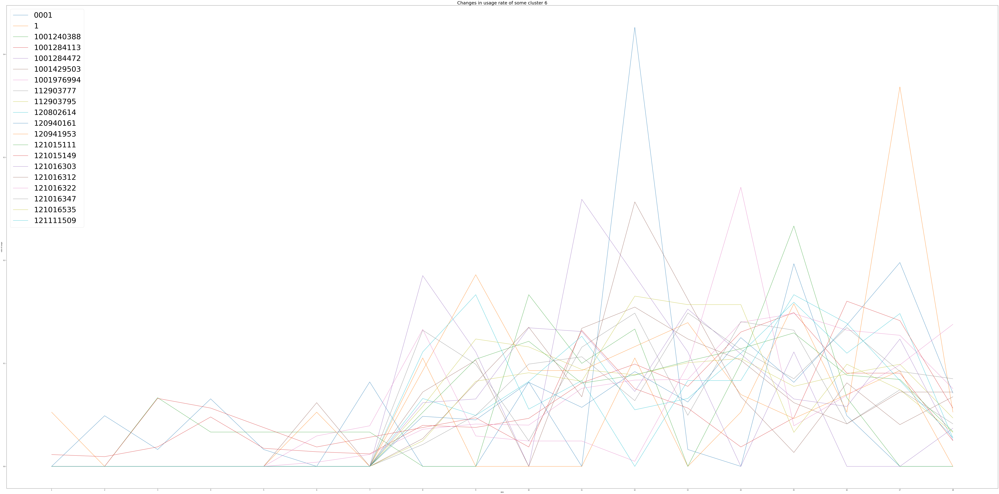

In [ ]:
show_cluster_dist(6)

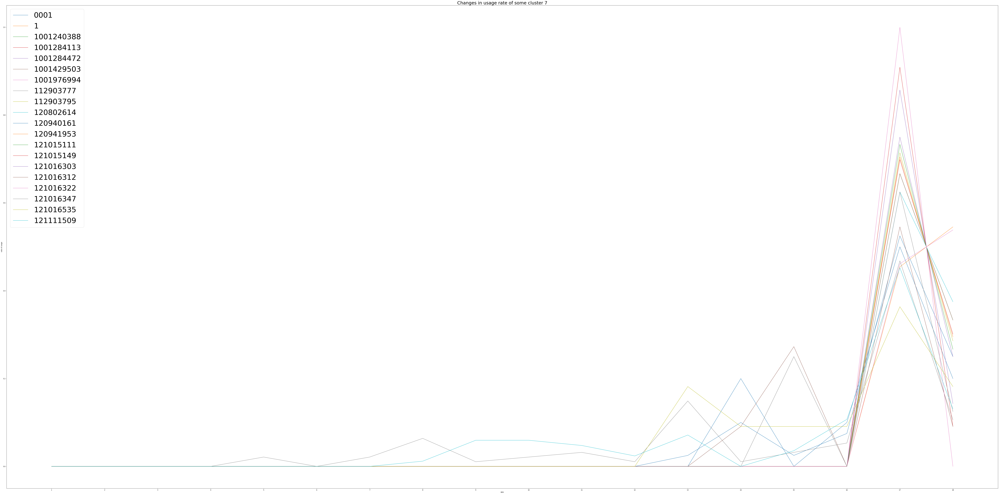

In [ ]:
show_cluster_dist(7)

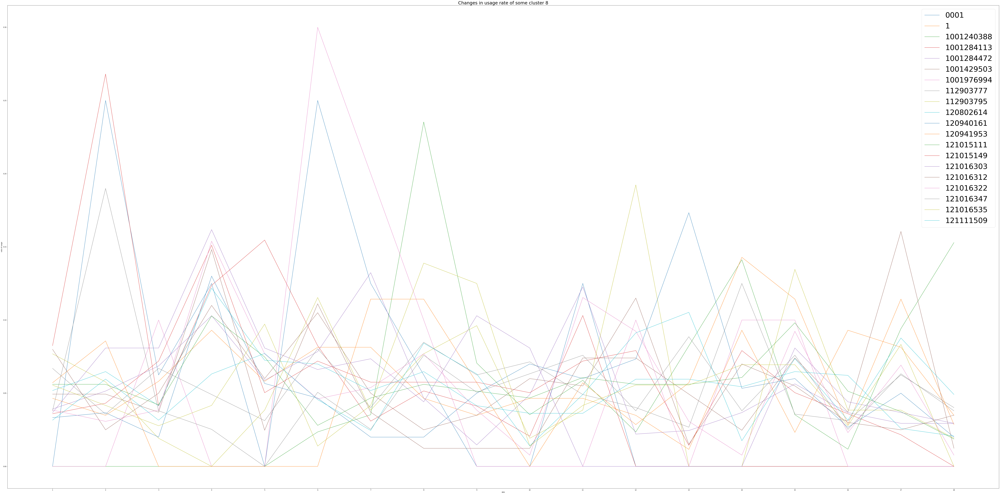

In [ ]:
show_cluster_dist(8)

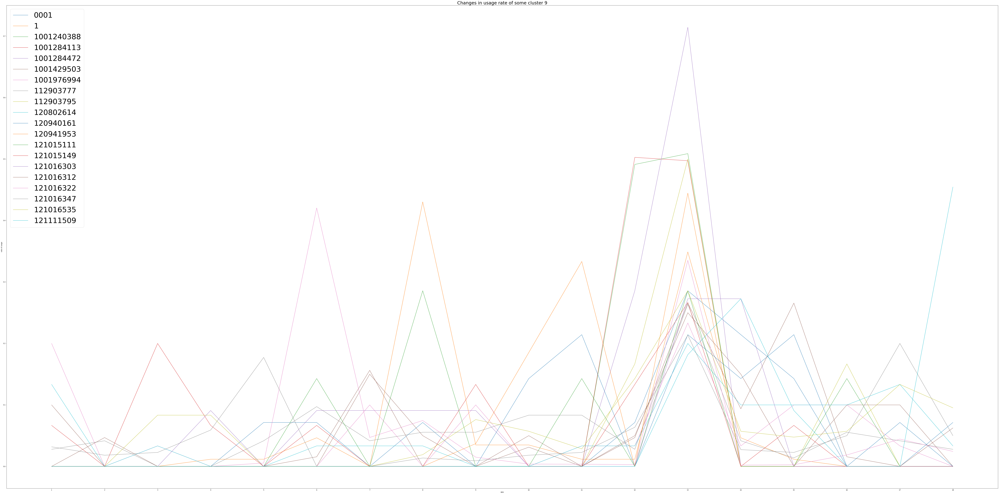

In [ ]:
show_cluster_dist(9)

## 품목 라벨

In [ ]:
# build helper df to map metrics to their cluster labels
df_cluster = pd.DataFrame(list(zip(result['ITEM_CD'], km.labels_)), columns=['metric', 'cluster'])

# make some helper dictionaries and lists
cluster_metrics_dict = df_cluster.groupby(['cluster'])['metric'].apply(lambda x: [x for x in x]).to_dict()
cluster_len_dict = df_cluster['cluster'].value_counts().to_dict()
clusters_dropped = [cluster for cluster in cluster_len_dict if cluster_len_dict[cluster]==1]
clusters_final = [cluster for cluster in cluster_len_dict if cluster_len_dict[cluster]>1]
clusters_final.sort()

df_cluster

,metric,cluster
0,0001,1
1,1,5
2,1001240388,8
3,1001284113,4
4,1001284472,8
...,...,...
5604,shop0001676,7
5605,shop0001678,7
5606,shop0001679,7
5607,whole800001,1


In [ ]:
df_cluster.to_pickle('/content/gdrive/Shareddrives/cj공모전/유림/cluster_label.pkl')